# Sanity check for trained model 
This is a mirror of 1.21 except that it evaluates a model trained with a single output class instead of two output classes. Previous models trained with 'absent' and 'present' encoded as different classes.

In [1]:
# imports
from pathlib import Path
import pandas as pd
import sys
BASE_PATH = Path.cwd().parent.parent
sys.path.append(str(BASE_PATH))
from src.utils import show_sample_from_df
import pandas as pd
import opensoundscape as opso
from opensoundscape import Audio, Spectrogram
import numpy as np


/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/opensoundscape/ml/cnn.py:18: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [2]:
# Load the validation set
valid_set_path = BASE_PATH / 'data' / 'interim' / 'valid_set' 
valid_set = pd.read_pickle(valid_set_path / 'valid_df_verified.pkl')
valid_set = valid_set.drop(columns=["target_absence"])
valid_set.sample(5)

,,,target_presence,confidence_cat
file,start_time,end_time,,
../../data/raw/recordings/OSFL/recording-293796.mp3,6.0,9.0,0.0,0
../../data/raw/recordings/OSFL/recording-140928.mp3,73.5,76.5,0.0,0
../../data/raw/recordings/OSFL/recording-554898.flac,37.5,40.5,0.0,0
../../data/raw/recordings/OSFL/recording-97768.mp3,52.5,55.5,0.0,0
../../data/raw/recordings/OSFL/recording-389684.flac,13.5,16.5,0.0,0


In [3]:
# Take a sample of 10 from each class
present_samples = valid_set.loc[valid_set['target_presence']==1].sample(10)
absent_samples = valid_set.loc[valid_set['target_presence']==0].sample(10)
present_samples.index[0]

(PosixPath('../../data/raw/recordings/OSFL/recording-554708.flac'), 18.0, 21.0)

In [4]:
# Load a trained model. 
model = opso.cnn.load_model(BASE_PATH / 'models' / 'osfl_model_single_neuron2024-03-07')
model.valid_metrics

{0: {'target_presence': {'au_roc': 0.637124,
   'avg_precision': 0.6542009838801834,
   'precision': 0.6127946127946128,
   'recall': 0.364,
   'f1': 0.4567126725219573,
   'support': 500},
  'precision': 0.5802237644342907,
  'recall': 0.567,
  'f1': 0.5483895864687924,
  'jaccard': 0.38329755302443,
  'hamming_loss': 0.433,
  'map': 0.6542009838801834,
  'au_roc': 0.637124},
 1: {'target_presence': {'au_roc': 0.8539680000000001,
   'avg_precision': 0.8835930434885025,
   'precision': 0.7306501547987616,
   'recall': 0.944,
   'f1': 0.8237347294938918,
   'support': 500},
  'precision': 0.8257770548005108,
  'recall': 0.798,
  'f1': 0.7936003858242293,
  'jaccard': 0.6588604891646435,
  'hamming_loss': 0.202,
  'map': 0.8835930434885025,
  'au_roc': 0.8539680000000001},
 2: {'target_presence': {'au_roc': 0.8949040000000001,
   'avg_precision': 0.911936395763816,
   'precision': 0.8551401869158879,
   'recall': 0.732,
   'f1': 0.7887931034482759,
   'support': 500},
  'precision': 0.81

In [5]:
valid_set_preds = model.predict(valid_set, batch_size=32, activation_layer='sigmoid')

/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/opensoundscape/ml/cnn.py:201: UserWarning: The columns of input samples df differ from `model.classes`.
  warnings.warn(


  0%|          | 0/344 [00:00<?, ?it/s]

In [6]:
valid_set.columns, valid_set_preds.columns

(Index(['target_presence', 'confidence_cat'], dtype='object'),
 Index(['target_presence'], dtype='object'))

# Sigmoid or Softmax activation?
Choose Sigmoid, because Softmax doesn't make sense for the binary case. Sigmoid will also create a smoother probability distribution than softmax due to the lack of the exponent in the formula. 

In [7]:
# Example sigmoid outputs
present_preds = model.predict(present_samples, activation_layer='sigmoid')
absent_preds = model.predict(absent_samples, activation_layer='sigmoid')
present_preds.rename(columns={"target_presence": "present_pred"}, inplace=True)
absent_preds.rename(columns={"target_presence": "present_pred"}, inplace=True)


/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/opensoundscape/ml/cnn.py:201: UserWarning: The columns of input samples df differ from `model.classes`.
  warnings.warn(


  0%|          | 0/10 [00:00<?, ?it/s]

/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/opensoundscape/ml/cnn.py:201: UserWarning: The columns of input samples df differ from `model.classes`.
  warnings.warn(


  0%|          | 0/10 [00:00<?, ?it/s]

In [8]:

# combine labels and predictions for samples of present and absent classes
present_labels_and_preds = pd.concat([present_samples, present_preds], axis=1)
absent_labels_and_preds = pd.concat([absent_samples, absent_preds], axis=1)
combined = pd.concat([present_labels_and_preds, absent_labels_and_preds], axis=0)

In [9]:
def show_example(counter):
    path, offset, end_time = combined.index[counter]
    duration = end_time - offset
    audio = Audio.from_file(path, offset=offset, duration=duration)
    spectrogram = Spectrogram.from_audio(audio)
    print(path, offset, end_time)
    print(audio.metadata)
    print(f"Confidence {combined.iloc[counter].confidence_cat}")
    print(f"Present Prediction = {combined.iloc[counter].present_pred} \nActual = {combined.iloc[counter].target_presence}")
    print("Check below")
    audio.show_widget()
    spectrogram.plot()
    counter += 1
    return counter


# Show Predictions
See example labels, predictions, audio and spectrograms below

In [10]:
next_example_idx = 0

../../data/raw/recordings/OSFL/recording-554708.flac 18.0 21.0
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 2646000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 2.0
Present Prediction = 0.9094372987747192 
Actual = 1.0
Check below


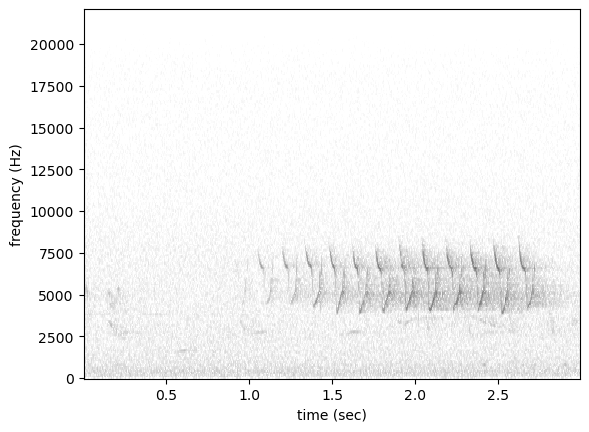

In [11]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-553643.flac 6.0 9.0
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 7938000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 2.0
Present Prediction = 0.998377799987793 
Actual = 1.0
Check below


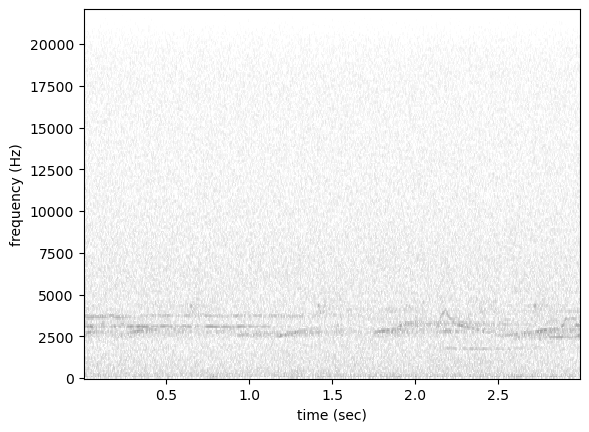

In [12]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-295799.mp3 15.0 18.0
{'samplerate': 44100, 'format': 'MP3', 'frames': 2653384, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 3.0
Present Prediction = 0.9944151639938354 
Actual = 1.0
Check below


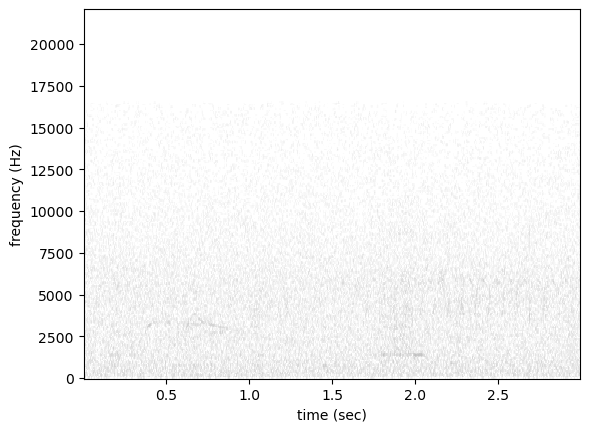

In [13]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-4684.mp3 132.0 135.0
{'samplerate': 44100, 'format': 'MP3', 'frames': 7938048, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 2.0
Present Prediction = 0.9934180974960327 
Actual = 1.0
Check below


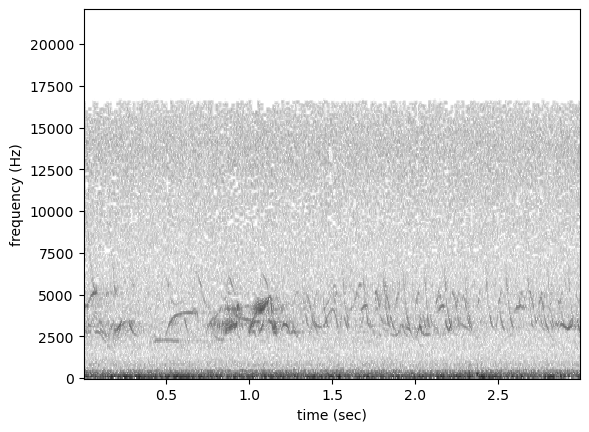

In [14]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-295478.mp3 0.0 3.0
{'samplerate': 44100, 'format': 'MP3', 'frames': 2653384, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 2.0
Present Prediction = 0.8731816411018372 
Actual = 1.0
Check below


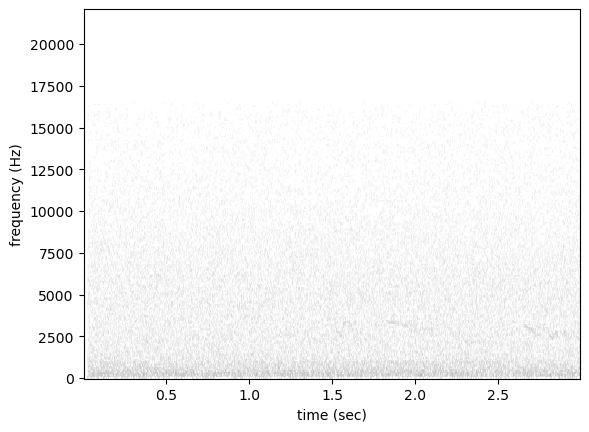

In [15]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-538573.flac 18.0 21.0
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 2646000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 1.0
Present Prediction = 0.08374980837106705 
Actual = 1.0
Check below


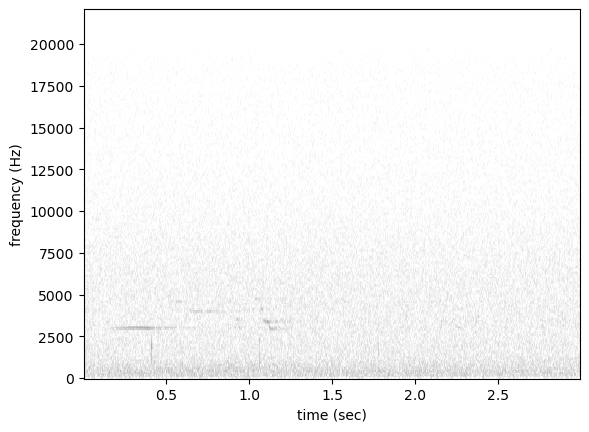

In [16]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-615591.flac 46.5 49.5
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 26460032, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 2.0
Present Prediction = 0.9996944665908813 
Actual = 1.0
Check below


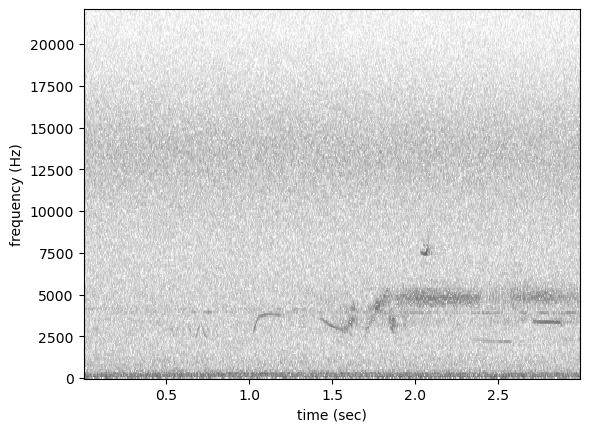

In [17]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-297253.mp3 12.0 15.0
{'samplerate': 44100, 'format': 'MP3', 'frames': 2653384, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 2.0
Present Prediction = 0.9994661211967468 
Actual = 1.0
Check below


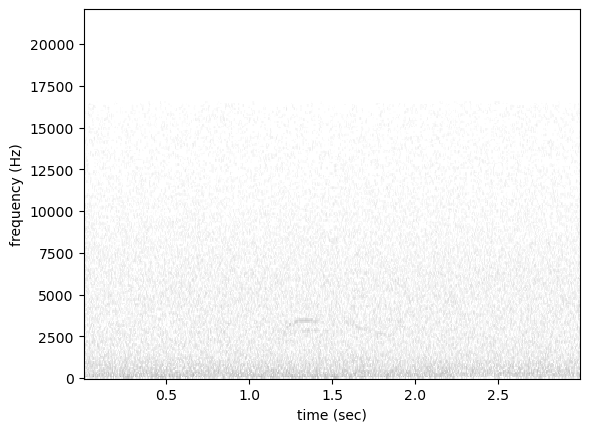

In [18]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-557062.flac 21.0 24.0
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 2646000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 1.0
Present Prediction = 0.936115026473999 
Actual = 1.0
Check below


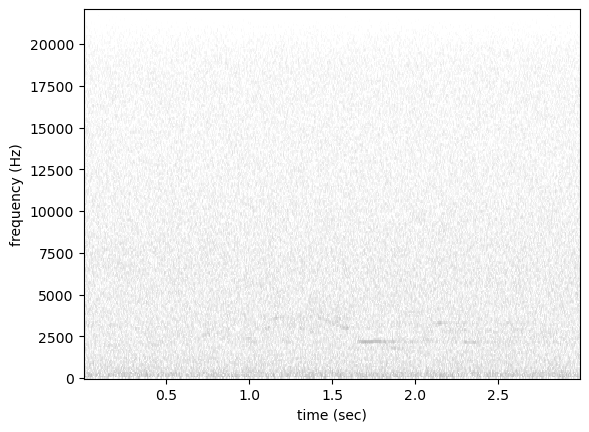

In [19]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-554895.flac 3.0 6.0
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 2646000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 3.0
Present Prediction = 0.999933123588562 
Actual = 1.0
Check below


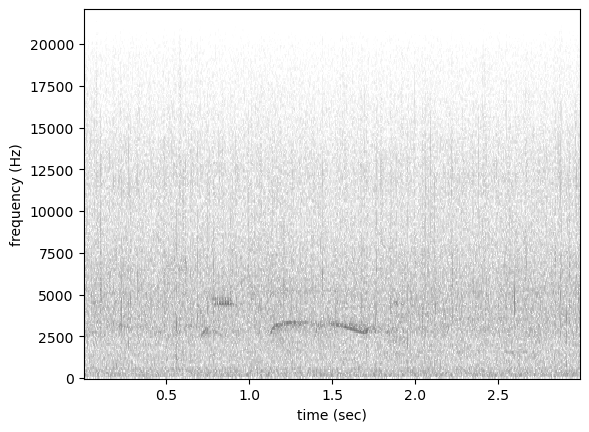

In [20]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-296000.mp3 10.5 13.5
{'samplerate': 44100, 'format': 'MP3', 'frames': 2653384, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 0.0
Present Prediction = 0.8216907382011414 
Actual = 0.0
Check below


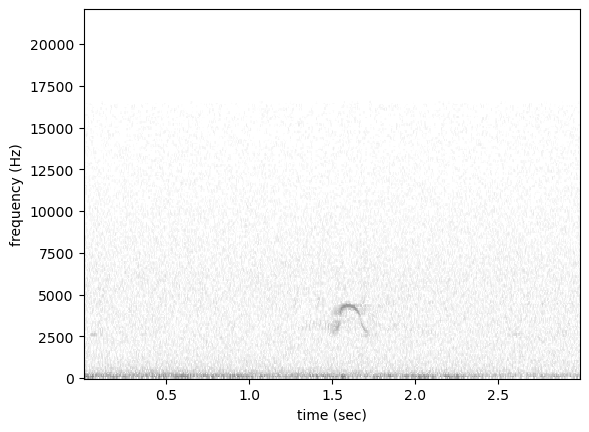

In [21]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-293469.mp3 39.0 42.0
{'samplerate': 44100, 'format': 'MP3', 'frames': 7957844, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 0.0
Present Prediction = 0.400587260723114 
Actual = 0.0
Check below


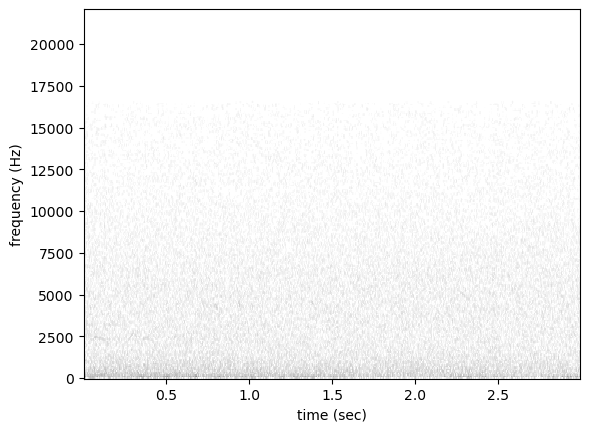

In [22]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-552524.flac 151.5 154.5
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 13225973, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 0.0
Present Prediction = 0.03377596661448479 
Actual = 0.0
Check below


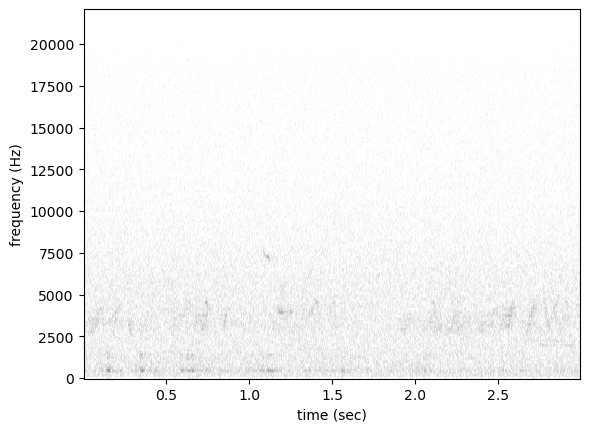

In [23]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-316009.mp3 4.5 7.5
{'samplerate': 44100, 'format': 'MP3', 'frames': 2653384, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 0.0
Present Prediction = 0.34089142084121704 
Actual = 0.0
Check below


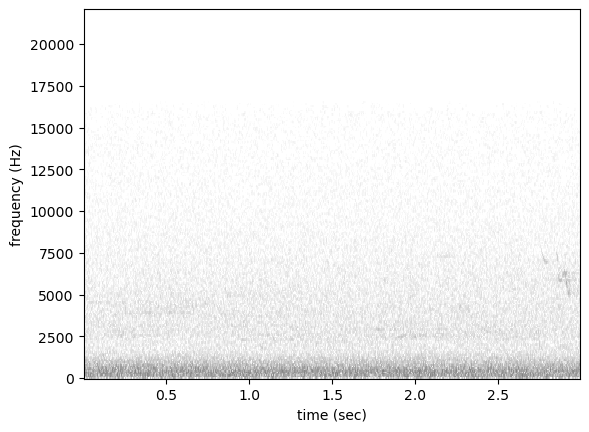

In [24]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-298091.mp3 15.0 18.0
{'samplerate': 44100, 'format': 'MP3', 'frames': 7957844, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 0.0
Present Prediction = 0.17778383195400238 
Actual = 0.0
Check below


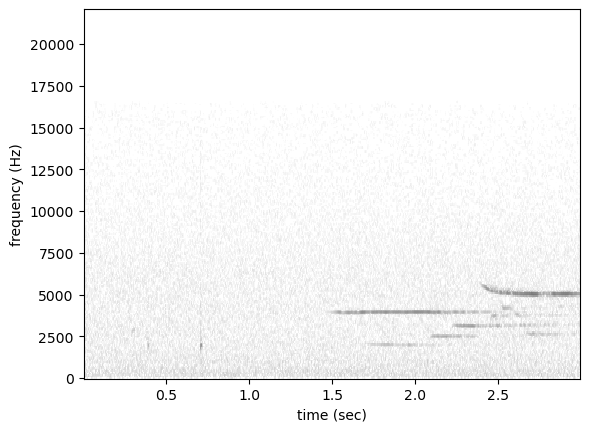

In [25]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-291521.mp3 1.5 4.5
{'samplerate': 44100, 'format': 'MP3', 'frames': 13259997, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 0.0
Present Prediction = 0.15386472642421722 
Actual = 0.0
Check below


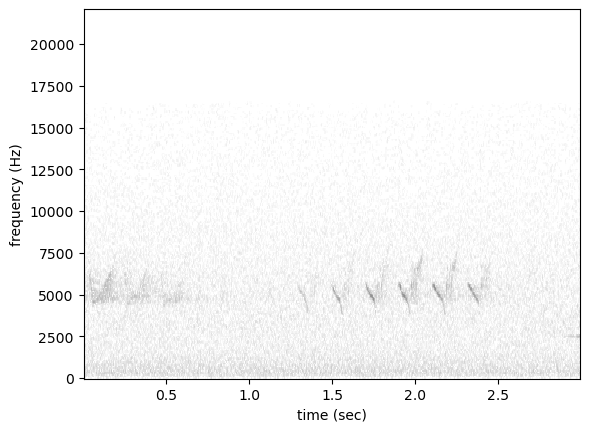

In [26]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-553642.flac 6.0 9.0
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 7938000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 0.0
Present Prediction = 0.4575091600418091 
Actual = 0.0
Check below


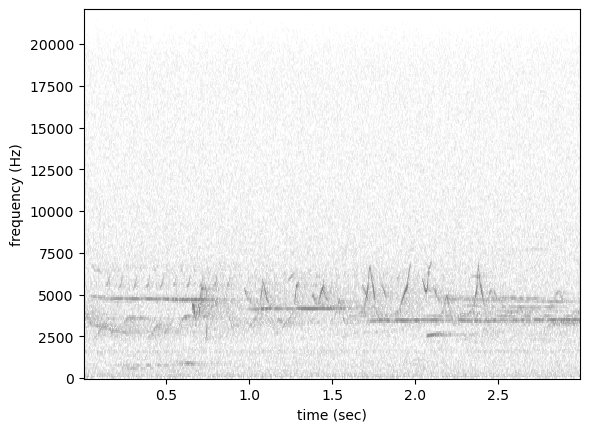

In [27]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-321055.flac 1.5 4.5
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 7926677, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 0.0
Present Prediction = 0.2014879286289215 
Actual = 0.0
Check below


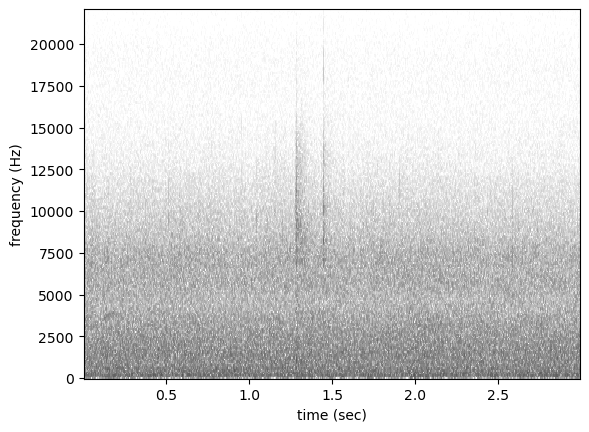

In [28]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-552808.flac 30.0 33.0
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 13225973, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 0.0
Present Prediction = 0.24146722257137299 
Actual = 0.0
Check below


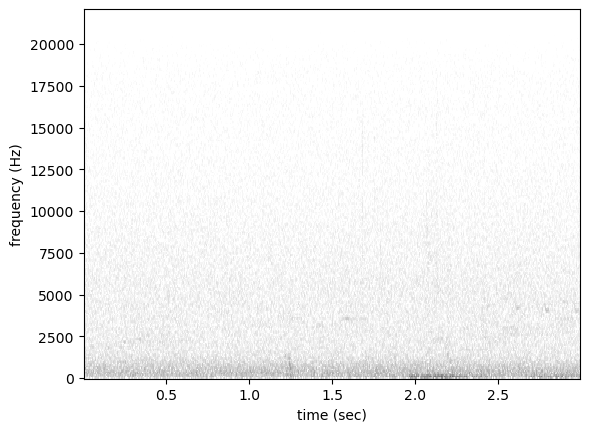

In [29]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-292278.mp3 3.0 6.0
{'samplerate': 44100, 'format': 'MP3', 'frames': 7957844, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 0.0
Present Prediction = 0.08680053055286407 
Actual = 0.0
Check below


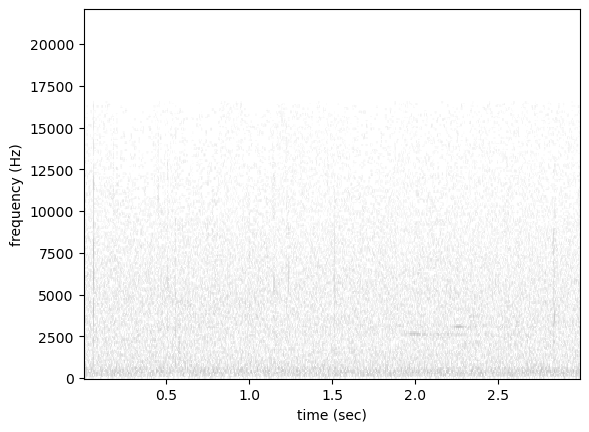

In [30]:
next_example_idx = show_example(next_example_idx)

# Check that the confusion matrix is working properly.

Here's the function which calculates the metrics. 


``` py
def single_target_metrics(targets, scores):
    """generate various metrics for a set of scores and labels (targets)

    Predicts 1 for the highest scoring class per sample and 0 for
    all other classes.

    Args:
        targets: 0/1 lables in 2d array
        scores: continuous values in 2d array

    Returns:
        metrics_dict: dictionary of various overall and per-class metrics

    """
    if max(np.sum(targets, 1)) > 1:
        raise ValueError(
            "Labels were not single target! "
            "Use multi-target classifier if multiple classes can be present "
            "in a single sample."
        )

    metrics_dict = {}

    preds = predict_single_target_labels(scores=scores)

    # Confusion matrix requires numbered-class not one-hot labels
    t = np.argmax(targets, 1)
    p = np.argmax(preds, 1)
    metrics_dict["confusion_matrix"] = M.confusion_matrix(t, p)

    # precision, recall, and f1
    pre, rec, f1, _ = M.precision_recall_fscore_support(
        targets, preds, average=None, zero_division=0
    )
    metrics_dict.update({"precision": pre[1], "recall": rec[1], "f1": f1[1]})

    try:
        metrics_dict["jaccard"] = M.jaccard_score(targets, preds, average="macro")
    except ValueError:
        metrics_dict["jaccard"] = np.nan
    try:
        metrics_dict["hamming_loss"] = M.hamming_loss(targets, preds)
    except ValueError:
        metrics_dict["hamming_loss"] = np.nan

    return metrics_dict
    ```

In [31]:
model.classes

['target_presence']

In [32]:
valid_set_with_confidence = valid_set.copy()
valid_set = valid_set.drop(columns=["confidence_cat"])

In [45]:
valid_set_preds.round()

target_presence
file                                               start_time end_time                 
../../data/raw/recordings/OSFL/recording-4478.mp3  0.0        3.0                   1.0
                                                   1.5        4.5                   0.0
                                                   3.0        6.0                   1.0
                                                   4.5        7.5                   1.0
                                                   6.0        9.0                   1.0
...                                                                                 ...
../../data/raw/recordings/OSFL/recording-816752... 33.0       36.0                  0.0
                                                   34.5       37.5                  0.0
                                                   36.0       39.0                  0.0
                                                   37.5       40.5                  0.0
                                                   40.5       43.5                  1.0

[10990 rows x 1 columns]

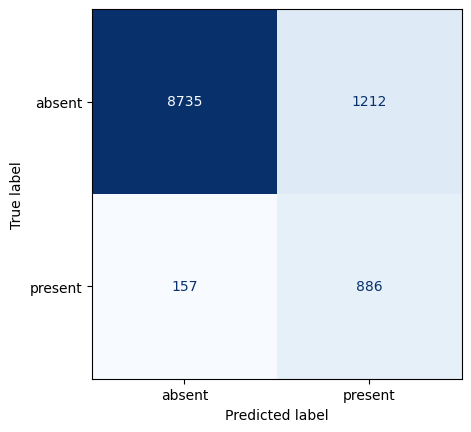

In [48]:
cm = opso.metrics.M.confusion_matrix(valid_set.target_presence, valid_set_preds.round() )
opso.metrics.M.ConfusionMatrixDisplay(cm, display_labels= ["absent", "present"]).plot(cmap='Blues', colorbar=False)

# Understanding the scikitlearn metrics 
### From the skleaern user guide 

#### 3.3. Metrics and scoring: quantifying the quality of predictions¶
##### 3.3.2.1. From binary to multiclass and multilabel

Some metrics are essentially defined for binary classification tasks (e.g. f1_score, roc_auc_score). In these cases, by default only the positive label is evaluated, assuming by default that the positive class is labelled 1 (though this may be configurable through the pos_label parameter).

In extending a binary metric to multiclass or multilabel problems, the data is treated as a collection of binary problems, one for each class. There are then a number of ways to average binary metric calculations across the set of classes, each of which may be useful in some scenario. Where available, you should select among these using the average parameter.

    "macro" simply calculates the mean of the binary metrics, giving equal weight to each class. In problems where infrequent classes are nonetheless important, macro-averaging may be a means of highlighting their performance. On the other hand, the assumption that all classes are equally important is often untrue, such that macro-averaging will over-emphasize the typically low performance on an infrequent class.

    "weighted" accounts for class imbalance by computing the average of binary metrics in which each class’s score is weighted by its presence in the true data sample.

    "micro" gives each sample-class pair an equal contribution to the overall metric (except as a result of sample-weight). Rather than summing the metric per class, this sums the dividends and divisors that make up the per-class metrics to calculate an overall quotient. Micro-averaging may be preferred in multilabel settings, including multiclass classification where a majority class is to be ignored.

    "samples" applies only to multilabel problems. It does not calculate a per-class measure, instead calculating the metric over the true and predicted classes for each sample in the evaluation data, and returning their (sample_weight-weighted) average.

    Selecting average=None will return an array with the score for each class.


The precision calculation from sklearn should be ordered like this. 

![Screenshot 2024-02-27 at 11.51.53.png](<attachment:Screenshot 2024-02-27 at 11.51.53.png>)
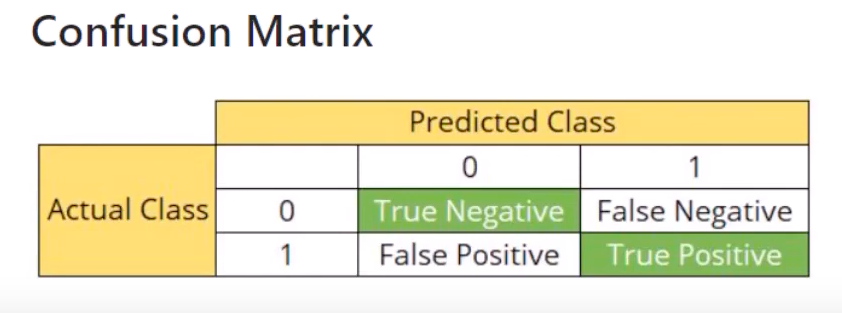

Predicted Class [0, 1] <br>
Actual Class 0 [TN, FN] <br>
Actual Class 1 [FP, TP]

# Plot top losses

In [91]:
valid_set_preds_renamed = valid_set_preds.rename(columns = {'target_presence':'present_pred'})
combined_full = pd.concat([valid_set_with_confidence, valid_set_preds_renamed], axis=1)

combined_full['loss'] = np.abs(combined_full['target_presence'] - combined_full['present_pred'])
top_losses = combined_full.sort_values(by='loss', ascending=False)
best_guesses = combined_full.sort_values(by='loss', ascending=True)

top_losses.head()


,,,target_presence,confidence_cat,present_pred,loss
file,start_time,end_time,,,,
../../data/raw/recordings/OSFL/recording-295476.mp3,1.5,4.5,0.0,0,0.999994,0.999994
../../data/raw/recordings/OSFL/recording-296360.mp3,0.0,3.0,0.0,0,0.999949,0.999949
../../data/raw/recordings/OSFL/recording-554938.flac,30.0,33.0,0.0,0,0.999912,0.999912
../../data/raw/recordings/OSFL/recording-538300.flac,268.5,271.5,0.0,0,0.999899,0.999899
../../data/raw/recordings/OSFL/recording-554941.flac,16.5,19.5,0.0,0,0.999899,0.999899


In [38]:
idx=0

In [92]:

def show_false_negatives(idx):
    df = top_losses.loc[top_losses.target_presence == 1.0]
    print(f"Model Confidence = {df.iloc[idx].present_pred}")
    print(f"Actual = {df.iloc[idx].target_presence}")
    show_sample_from_df(df, idx)

def show_false_positives(idx):
    df = top_losses.loc[top_losses.target_presence == 0.0]
    print(f"Model Confidence = {df.iloc[idx].present_pred}")
    print(f"Actual = {df.iloc[idx].target_presence}")
    show_sample_from_df(df, idx)

def show_true_positives(idx):
    df = best_guesses.loc[best_guesses.target_presence == 1.0]
    print(f"Model Confidence = {df.iloc[idx].present_pred}")
    print(f"Actual = {df.iloc[idx].target_presence}")
    show_sample_from_df(df, idx)

def show_true_negatives(idx):
    df = best_guesses.loc[best_guesses.target_presence == 0.0]
    print(f"Model Confidence = {df.iloc[idx].present_pred}")
    print(f"Actual = {df.iloc[idx].target_presence}")
    show_sample_from_df(df, idx)

In [55]:
idx = 0

Predicted = 0.9987395405769348
Model Confidence = 0.9987395405769348
Actual = 0.0
../../data/raw/recordings/OSFL/recording-293255.mp3 1.5 4.5


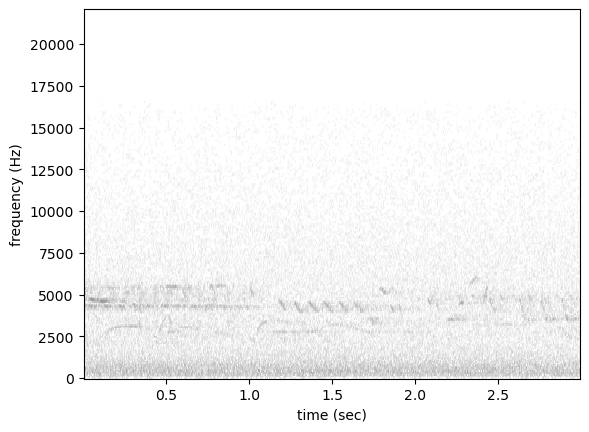

In [84]:
show_false_positives(idx)
idx+=1

Predicted = 0.05861441418528557
Model Confidence = 0.05861441418528557
Actual = 1.0
../../data/raw/recordings/OSFL/recording-218582.mp3 4.5 7.5


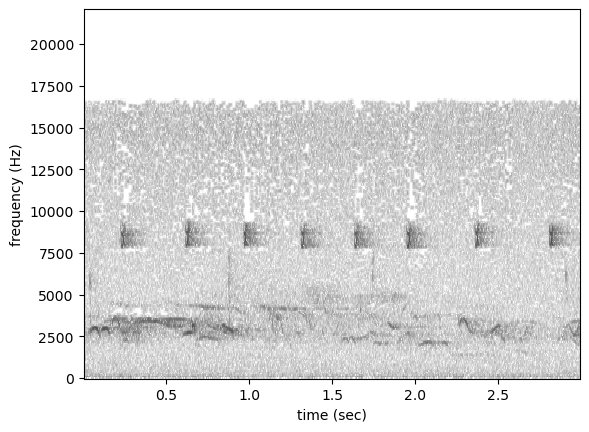

In [90]:
show_false_negatives(idx)
idx+=1

In [93]:
idx=0

Model Confidence = 0.9999785423278809
Actual = 1.0
../../data/raw/recordings/OSFL/recording-292791.mp3 9.0 12.0


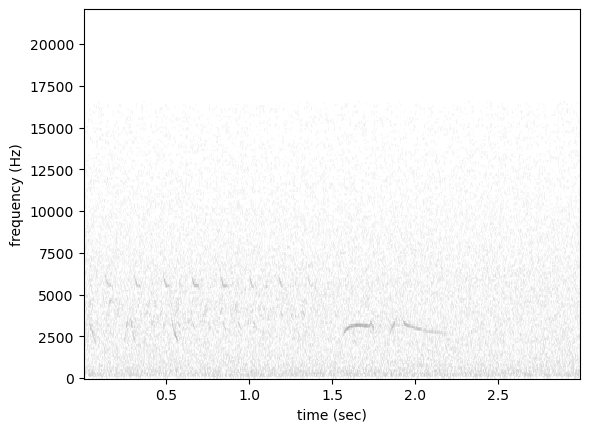

In [116]:
show_true_positives(idx)
idx+=1

In [117]:
idx=0

Model Confidence = 0.0007945956895127892
Actual = 0.0
../../data/raw/recordings/OSFL/recording-482321.flac 246.0 249.0


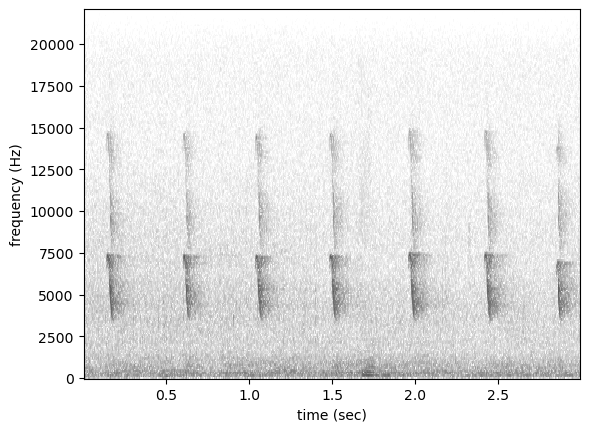

In [138]:
show_true_negatives(idx)
idx+=1